In [1]:
source("Main.R")
source("Conf.R")
source("Utilities.R")
source("DAVID_query.R")
library("factoextra")
library("maptree")
library("ggpubr")
library(NMF)

library(repr)
fileDir = "/home/beraslan/jovian-work/analysisSingle/"
geneCutOff=2
targetCutOff=14

corrplot 0.84 loaded


********************************************************

Note: As of version 1.0.0, cowplot does not change the

  default ggplot2 theme anymore. To recover the previous

  behavior, execute:
  theme_set(theme_cowplot())

********************************************************



Attaching package: ‘pls’


The following object is masked from ‘package:corrplot’:

    corrplot


The following object is masked from ‘package:stats’:

    loadings


Loading required package: AnnotationDbi

Loading required package: stats4

Loading required package: BiocGenerics

Loading required package: parallel


Attaching package: ‘BiocGenerics’


The following objects are masked from ‘package:parallel’:

    clusterApply, clusterApplyLB, clusterCall, clusterEvalQ,
    clusterExport, clusterMap, parApply, parCapply, parLapply,
    parLapplyLB, parRapply, parSapply, parSapplyLB


The following objects are masked from ‘package:stats’:

    IQR, mad, sd, var, xtabs


The following o

In [3]:
coefsAll <- read.csv("/home/beraslan/jovian-work/analysisSingle/MixedEffectLMOutputs/ME_LMBetaCoefsALL.csv", row.names = 1, )
pValsAll <- read.csv("/home/beraslan/jovian-work/analysisSingle/MixedEffectLMOutputs/ME_LMPValuesALL.csv", row.names = 1)
pValsAll <- pValsAll[rownames(pValsAll) %ni% c("Intercept", "n_genes", "mt_frac", "Group Var"),]
coefsAll <- coefsAll[rownames(coefsAll) %ni% c("Intercept", "n_genes", "mt_frac", "Group Var"),]

In [4]:
pValsAllAdj <- sapply(pValsAll, function(x){p.adjust(x, method = "fdr", n = length(x))})
rownames(pValsAllAdj) <- rownames(pValsAll)

In [5]:
dim(pValsAllAdj)

[1] 1031 6685

In [6]:
s1 <- apply(pValsAllAdj, 1, function(x){return(length(which(x < 0.1)))})
head(s1)

GENE_4921501E09Rik_ GENE_4930595M18Rik_ GENE_8030462N17Rik_          GENE_Aamp_ 
                  9                  11                   7                  61 
        GENE_Abtb1_         GENE_Abtb2_ 
                  9                  14

In [7]:
coefsAll <- coefsAll[s1>targetCutOff,]
pValsAllAdj <- pValsAllAdj[s1>targetCutOff,]

In [8]:
dim(coefsAll)

[1]  329 6685

In [9]:
s2 <- apply(pValsAllAdj, 2, function(x){return(length(which(x < 0.1)))})
s2Freq <- data.frame(table(s2), stringsAsFactors = FALSE)
# head(s2Freq)

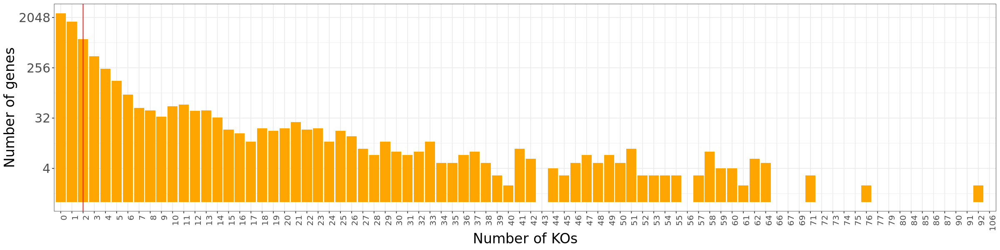

In [10]:
s2Freq$s2 <- as.character(s2Freq$s2)
s2Freq$s2 <- factor(as.character(s2Freq$s2), levels=as.character(sort(as.numeric(s2Freq$s2))))
 
options(repr.plot.width=20, repr.plot.height=5)
ggplot(data=s2Freq, aes(x=s2, y=Freq)) +
    geom_bar(stat="identity", fill="orange")+
    theme_bw()+theme(axis.text.x = element_text(angle = 90, hjust = 1, size=12), axis.text.y = element_text(size=18), 
                     axis.title = element_text(size=20) )+scale_y_continuous(trans="log2")+
    ylab("Number of genes")+xlab("Number of KOs")+geom_vline(xintercept = (geneCutOff+1), color="red")
  

In [11]:
dim(coefsAll[, s2 > geneCutOff])

[1]  329 1699

In [12]:
coefsAll <- coefsAll[, s2 > geneCutOff]
pValsAllAdj <- pValsAllAdj[, s2 > geneCutOff]

In [13]:
dim(coefsAll)

[1]  329 1699

In [14]:
#  write.csv(coefsAll, "/home/beraslan/jovian-work/analysisSingle/MixedEffectLMOutputs/ME_SignificantBetaCoefs_ForGeneModules.csv", quote=FALSE)
#  write.csv(pValsAllAdj, "/home/beraslan/jovian-work/analysisSingle/MixedEffectLMOutputs/ME_AdjustedPValues_ForGeneModules.csv", quote=FALSE)

In [15]:
dim(coefsAll)

[1]  329 1699

In [16]:
M_g = cor((coefsAll), method = "pearson")
diag(M_g) <- 0

In [17]:
dim(M_g)

[1] 1699 1699

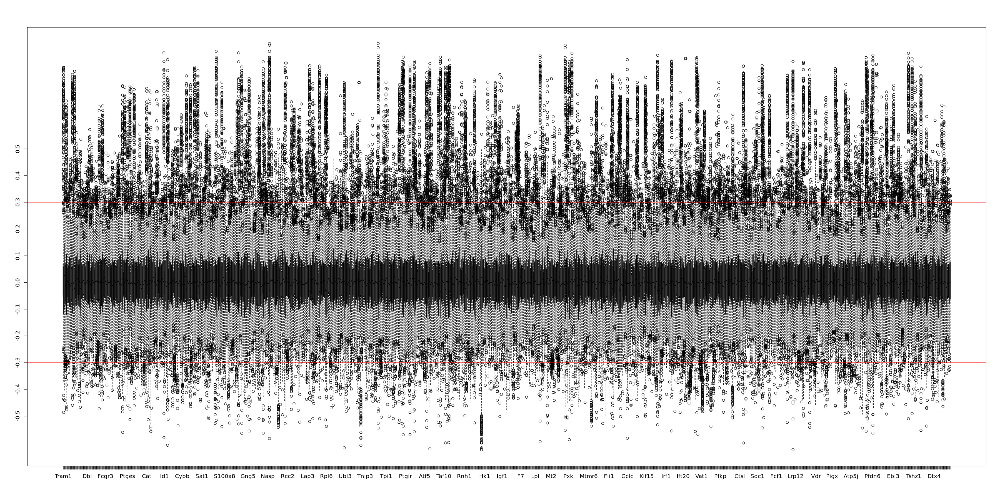

In [18]:
options(repr.plot.width=30, repr.plot.height=15)
boxplot(M_g)
abline(h=0.3, col="red")
abline(h= -0.3, col="red")
axis(2, at = seq(-0.5,0.5,0.1))

In [ ]:
# deneme <- prcomp(M_g,rank. = 200)

In [ ]:
# fviz_eig(deneme,ncp = 100)


In [ ]:
# options(repr.plot.width=10, repr.plot.height=5)

# fviz_nbclust(M_g, kmeans, method = "wss", k.max = 100)

In [ ]:
# k2 <- kmeans(M_g, centers = 100, nstart = 25)


In [ ]:
# fviz_cluster(k2, data = M_g,ellipse =  FALSE)


In [ ]:
# summary(deneme)

In [ ]:
# fviz_nbclust(M1, kmeans, method = "wss")


In [ ]:
# fviz_nbclust(M1, kmeans, method = "silhouette")


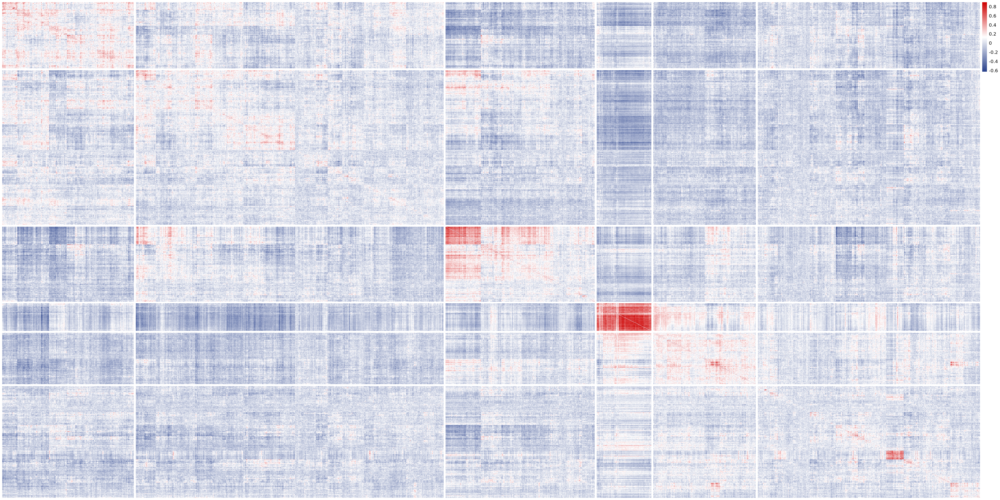

In [19]:
hm1 <- pheatmap(M_g,show_rownames = FALSE, show_colnames = FALSE,
                treeheight_row = 0, treeheight_col = 0,
                cutree_rows = 6, cutree_cols  = 6,
                color=colorRampPalette(c("royalblue4","white","red3"))(200),
                clustering_method="ward.D2", 
                clustering_distance_rows="euclidean",
                clustering_distance_cols="euclidean" )


[1] 82

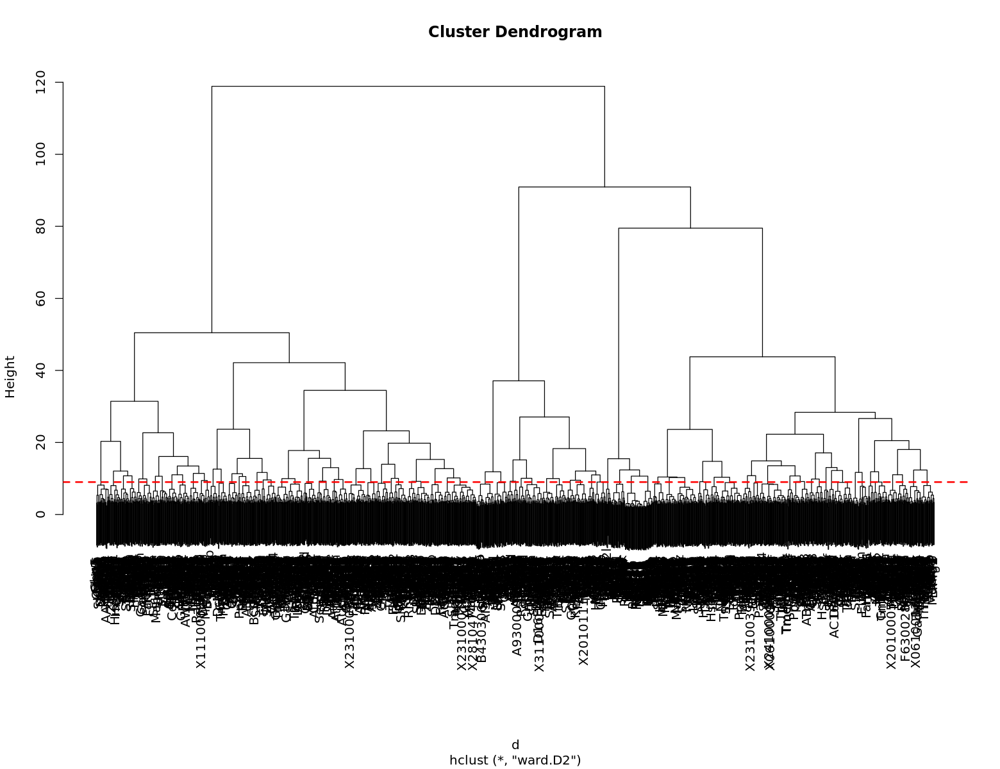

In [36]:
#ctree=2
ctree=9

options(repr.plot.width=13, repr.plot.height=10)

plot(hm1$tree_row)
abline(h=ctree, col="red", lty=2, lwd=2)
geneClusters <- cutree(hm1$tree_ro, h=ctree)
length(unique(geneClusters))


In [37]:
min(table(geneClusters))

[1] 7

In [38]:
max(table(geneClusters))

[1] 56

In [39]:
table(geneClusters)

geneClusters
 1  2  3  4  5  6  7  8  9 10 11 12 13 14 15 16 17 18 19 20 21 22 23 24 25 26 
25 22 19 10 29 25 28 14 25 28 26 23 24 23 21  8 18 24 12 19 56 26 13 20 11 37 
27 28 29 30 31 32 33 34 35 36 37 38 39 40 41 42 43 44 45 46 47 48 49 50 51 52 
20 35 27 28 20 26 26 14 21 15 20 13  7 23 22 20 18 17 11 19 11 18 36 23 11 16 
53 54 55 56 57 58 59 60 61 62 63 64 65 66 67 68 69 70 71 72 73 74 75 76 77 78 
14 38 20 29 11 15 20 41 11 15 52 27 17 13 12 11 21 15 26 44 11 14 10 12 12 13 
79 80 81 82 
19 35 11  7 

In [40]:
geneModules <- data.frame(GeneName=names(geneClusters[hm1$tree_row$order]),
                          GeneGroup=factor(geneClusters[hm1$tree_row$order]), stringsAsFactors = F)
rownames(geneModules) <- names(geneClusters[hm1$tree_row$order])

In [41]:
length(unique(geneModules$GeneGroup))

[1] 82

In [42]:
write.csv(geneModules, "/home/beraslan/jovian-work/analysisSingle/ME_GeneModules_206_Modules.csv", quote = F)
